In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import time
from pathlib import Path
import pandas as pd

## load and preprocess unlabeled data

In [2]:

def load_and_preprocess_images(path, image_size=(64, 64), batch_size=32):
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),  # Adding a center crop
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1]
    ])
    dataset = ImageFolder(root=path, transform=transform)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return loader



## define the GAN

In [3]:
# Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.linear = nn.Linear(100, 8*8*256)

        self.init_layers = nn.Sequential(
            self.linear,
            nn.BatchNorm1d(8*8*256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Unflatten(1, (256, 8, 8))
        )

        self.conv_layers = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            # Remove the layer that upsamples to 128x128
            # nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(32),
            # nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),  # Adjust this layer to take 64 channels as input
            nn.Tanh()
        )

    def forward(self, input):
        x = self.init_layers(input)
        return self.conv_layers(x)




## discriminator

In [4]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 5, 2, 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(64, 128, 5, 2, 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Flatten(),
            nn.Linear(32768, 1)  # Corrected linear layer input size
        )

    def forward(self, input):
        # print("Discriminator Input Shape:", input.shape)
        x = self.main(input)
        # print("Discriminator Output Shape:", x.shape)
        return self.main(input)


## Image Generation and Saving

In [5]:
def generate_and_save_images(generator, epoch, test_input):
    with torch.no_grad():
        generator.eval()  # Set the generator to evaluation mode
        generated_images = generator(test_input).cpu()

    # Plot and save images
    fig = plt.figure(figsize=(4, 4))
    for i in range(generated_images.size(0)):
        plt.subplot(4, 4, i + 1)
        plt.imshow(generated_images[i].permute(1, 2, 0) * 0.5 + 0.5)  # Rescale to [0, 1]
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()


## save model checkpoints

In [6]:
def model_save(generator, discriminator, optimizer_g, optimizer_d, epoch, file_path='model_checkpoint'):
    torch.save({
        'epoch': epoch,
        'generator_state_dict': generator.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'optimizer_g_state_dict': optimizer_g.state_dict(),
        'optimizer_d_state_dict': optimizer_d.state_dict(),
    }, f'{file_path}_{epoch}.pth')


## loss and optimizer

In [7]:
# Loss function
criterion = nn.BCEWithLogitsLoss()

def discriminator_loss(real_output, fake_output):
    # Labels for real images are all ones, for fake images are all zeros
    real_labels = torch.ones_like(real_output)
    fake_labels = torch.zeros_like(fake_output)

    # Real images loss
    real_loss = criterion(real_output, real_labels)

    # Fake images loss
    fake_loss = criterion(fake_output, fake_labels)

    # Total loss
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    # Generator wants discriminator to think that fake images are real
    real_labels = torch.ones_like(fake_output)
    return criterion(fake_output, real_labels)



## training step function

In [8]:

def train_step(generator, discriminator, images, noise_dim, optimizer_g, optimizer_d, criterion):
    print("train_step called")  # Confirming train_step is called
    batch_size = images.size(0)
    real_labels = torch.ones(batch_size, 1)
    fake_labels = torch.zeros(batch_size, 1)

    # Training Discriminator
    optimizer_d.zero_grad()
    
    # Real images
    # print("Processing real images")  # Before processing real images
    real_output = discriminator(images)
    d_loss_real = criterion(real_output, real_labels)

    # Fake images
    # noise = torch.randn(batch_size, noise_dim, 1, 1)
    noise = torch.randn(batch_size, noise_dim)
    # print("Noise Vector Shape:", noise.shape)
    # print("Generating fake images")  # Before generating fake images
    fake_images = generator(noise)
    # print("Generated Images Shape (before detach):", fake_images.shape)
    # fake_images_detached = fake_images.detach()
    # print("Generated Images Shape (after detach):", fake_images_detached.shape)
    fake_output = discriminator(fake_images.detach())
    d_loss_fake = criterion(fake_output, fake_labels)

    # Backprop and optimize
    d_loss = d_loss_real + d_loss_fake
    d_loss.backward()
    optimizer_d.step()

    # Training Generator
    optimizer_g.zero_grad()
    
    # Getting discriminator's predictions on fake images
    output = discriminator(fake_images)
    g_loss = criterion(output, real_labels)

    # Backprop and optimize
    g_loss.backward()
    optimizer_g.step()

    return d_loss, g_loss

## Set up the training loop for the GAN.

In [9]:
EPOCHS = 600
noise_dim = 100
num_examples_to_generate = 16

# Creating a fixed noise vector to visualize progress
# fixed_noise = torch.randn(num_examples_to_generate, noise_dim, 1, 1)
fixed_noise = torch.randn(num_examples_to_generate, noise_dim)


# model instantiation and dataset preparation

In [10]:
generator = Generator()
discriminator = Discriminator()

# Optimizers
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=1e-4)
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=1e-4)



In [11]:
PATH = Path('./dataset/CUB_200_2011')
dataset_path = PATH/"images"
gan_image_loader = load_and_preprocess_images(dataset_path)

## training loop

In [12]:
def train(generator, discriminator, dataset, epochs, noise_dim, optimizer_g, optimizer_d, criterion):
    for epoch in range(epochs):
        start = time.time()

        for i, (images, _) in enumerate(dataset):
            d_loss, g_loss = train_step(generator, discriminator, images, noise_dim, optimizer_g, optimizer_d, criterion)

        generate_and_save_images(generator, epoch + 1, fixed_noise)

        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))

        # Save the model every 15 epochs
        if (epoch + 1) % 15 == 0:
            model_save(generator, discriminator, optimizer_g, optimizer_d, epoch + 1)

    generate_and_save_images(generator, epochs, fixed_noise)

## run the training

train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step

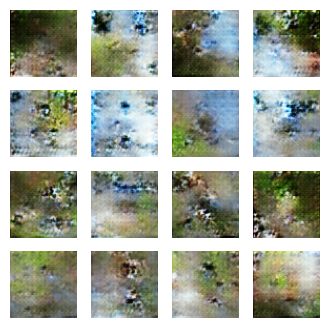

Time for epoch 1 is 160.26232600212097 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

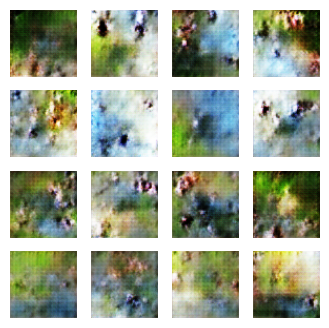

Time for epoch 2 is 158.55877709388733 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

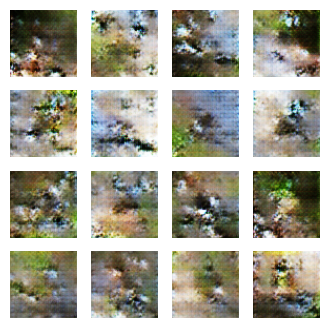

Time for epoch 3 is 158.71131563186646 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

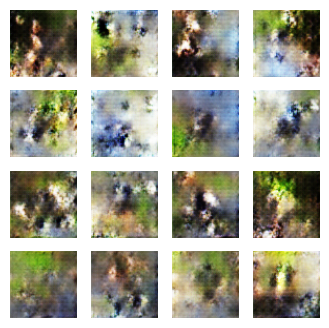

Time for epoch 4 is 161.35881304740906 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

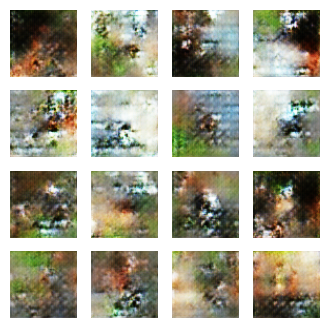

Time for epoch 5 is 168.9745330810547 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
trai

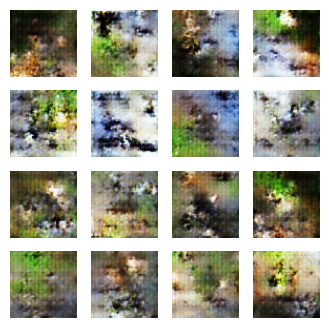

Time for epoch 6 is 158.03201532363892 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

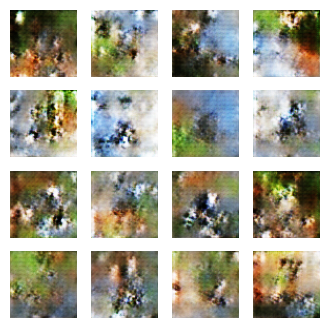

Time for epoch 7 is 156.31741452217102 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

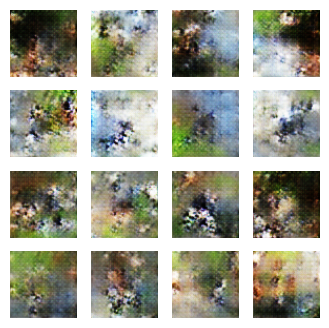

Time for epoch 8 is 156.4629385471344 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
trai

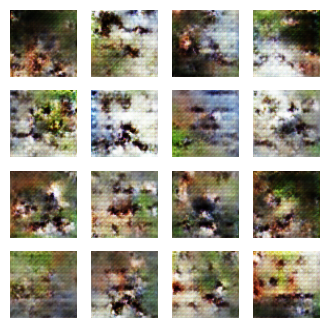

Time for epoch 9 is 155.60847520828247 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

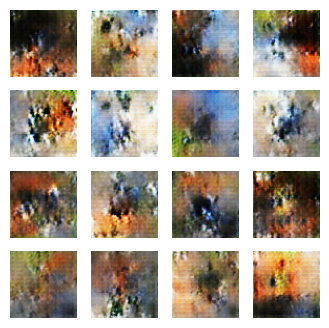

Time for epoch 10 is 172.94369339942932 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

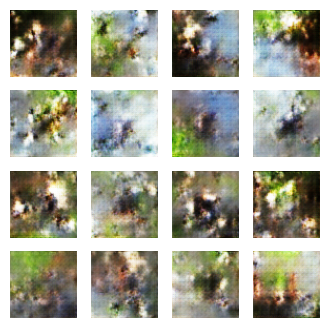

Time for epoch 11 is 162.7222445011139 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

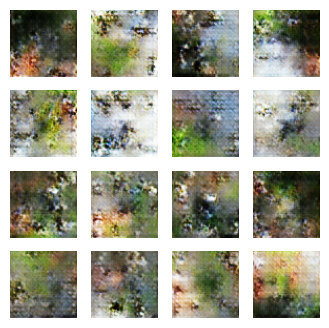

Time for epoch 12 is 179.13689994812012 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

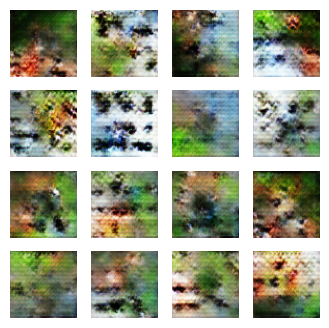

Time for epoch 13 is 175.19352626800537 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

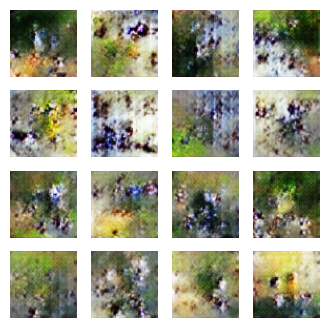

Time for epoch 14 is 175.1490602493286 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

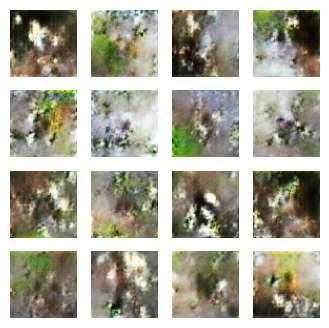

Time for epoch 15 is 174.1705358028412 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

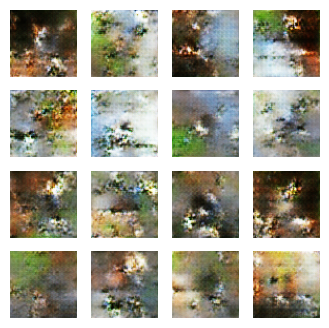

Time for epoch 16 is 192.12728214263916 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

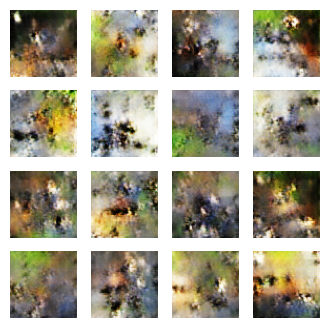

Time for epoch 17 is 194.14900064468384 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

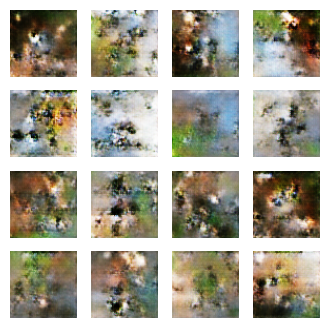

Time for epoch 18 is 198.9648609161377 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

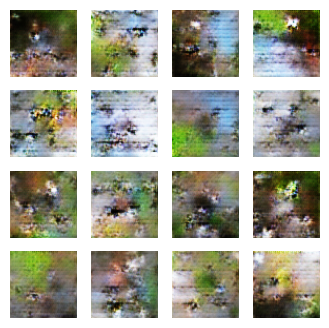

Time for epoch 19 is 198.8152186870575 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

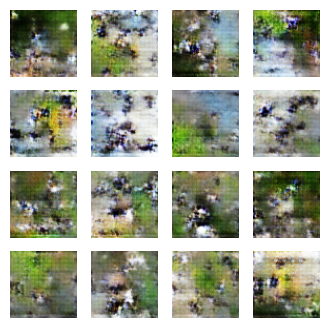

Time for epoch 20 is 194.7463719844818 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

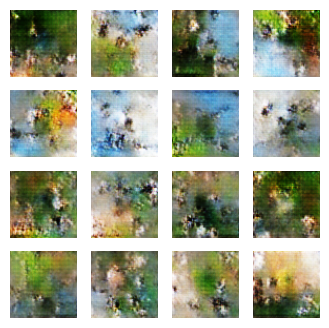

Time for epoch 21 is 195.55588793754578 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

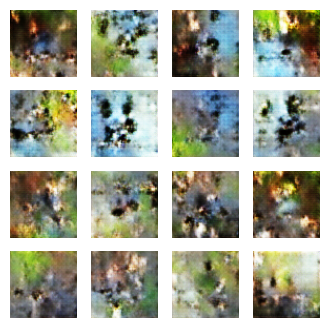

Time for epoch 22 is 157.22786784172058 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

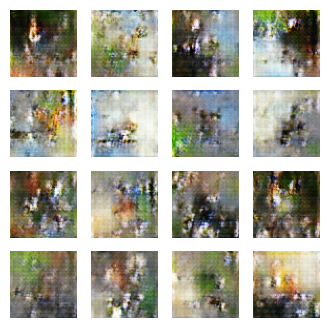

Time for epoch 23 is 144.4607892036438 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

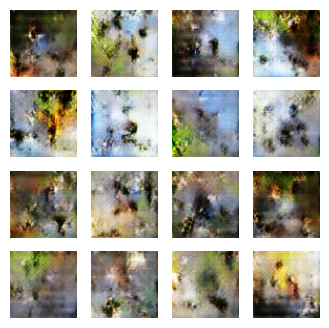

Time for epoch 24 is 143.59692525863647 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

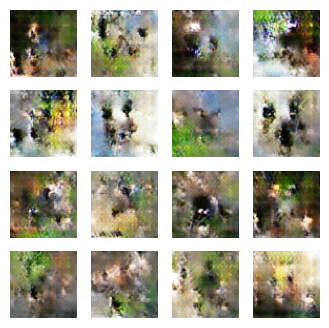

Time for epoch 25 is 143.8902564048767 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

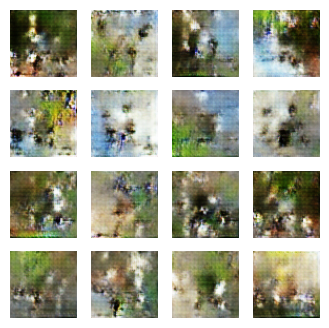

Time for epoch 26 is 148.54593634605408 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

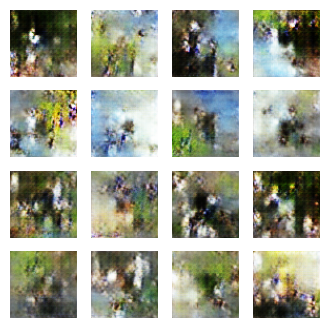

Time for epoch 27 is 141.38841319084167 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

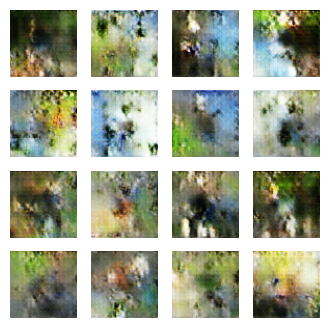

Time for epoch 28 is 139.87966585159302 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

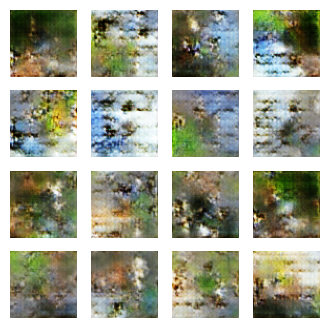

Time for epoch 29 is 141.2052173614502 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

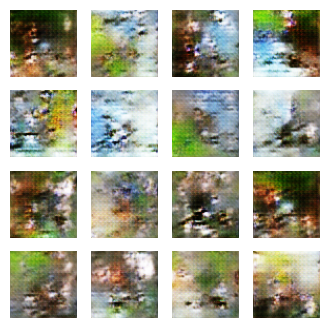

Time for epoch 30 is 139.55444836616516 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

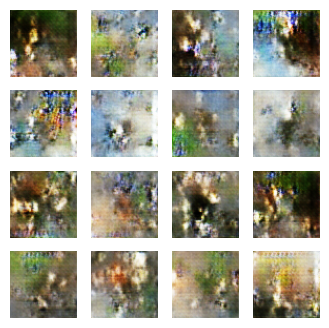

Time for epoch 31 is 145.84209513664246 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

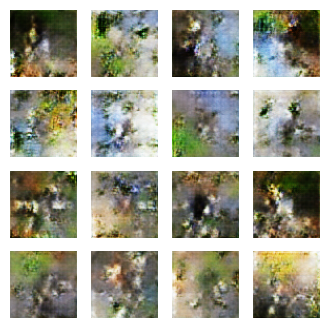

Time for epoch 32 is 144.92043471336365 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

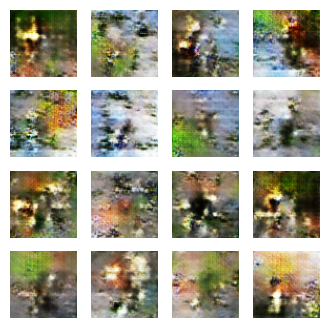

Time for epoch 33 is 139.68561697006226 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

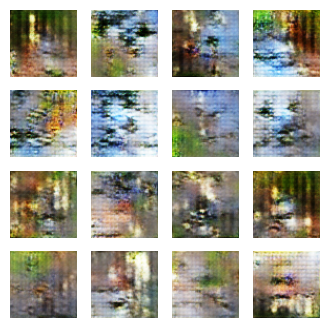

Time for epoch 34 is 143.3305275440216 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

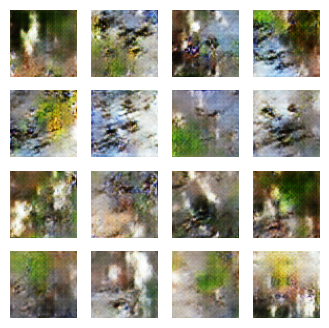

Time for epoch 35 is 141.33286476135254 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

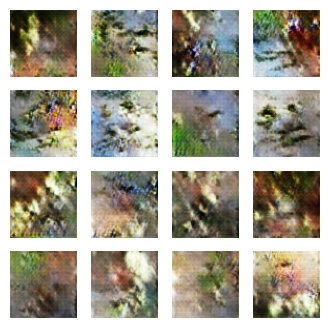

Time for epoch 36 is 143.43843722343445 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

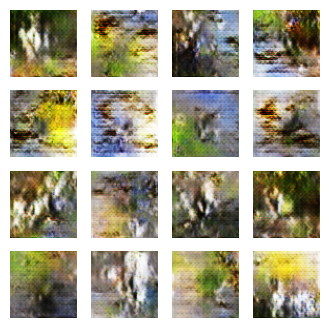

Time for epoch 37 is 142.4471983909607 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

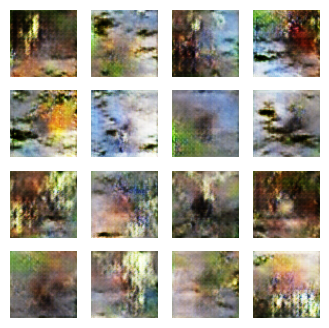

Time for epoch 38 is 149.6287226676941 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

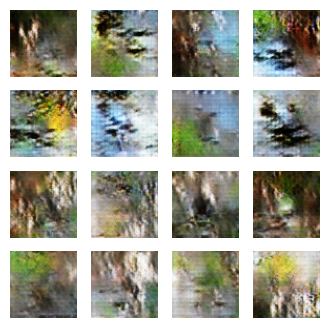

Time for epoch 39 is 129.48731327056885 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

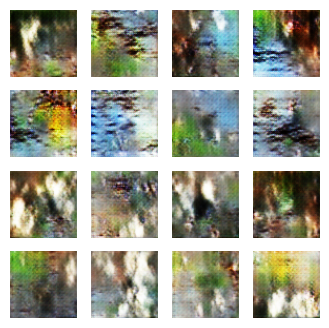

Time for epoch 40 is 130.15418553352356 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

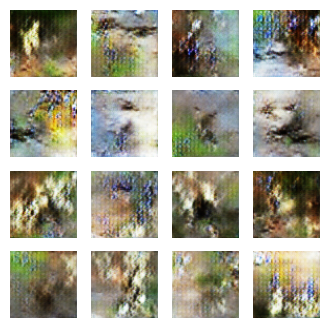

Time for epoch 41 is 133.6244764328003 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

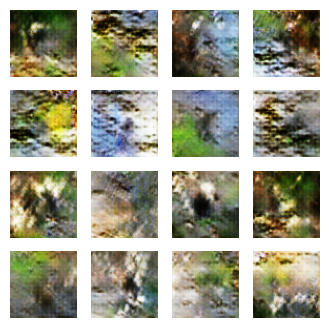

Time for epoch 42 is 135.64399027824402 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

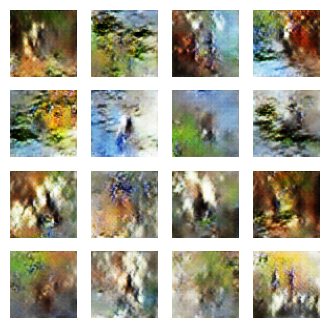

Time for epoch 43 is 127.13819098472595 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

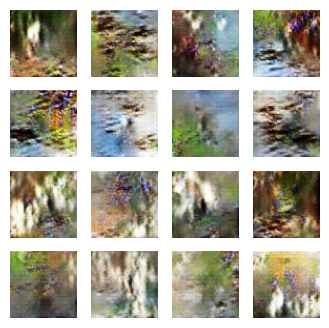

Time for epoch 44 is 131.02289414405823 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

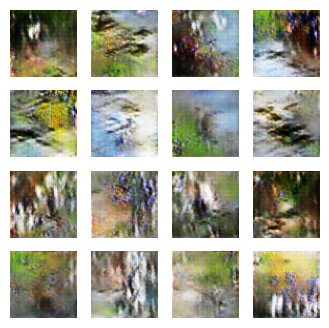

Time for epoch 45 is 130.54070043563843 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

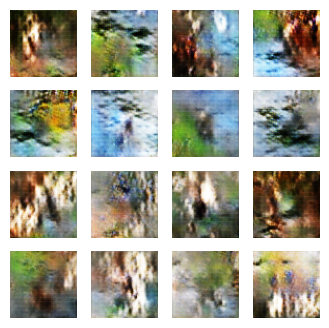

Time for epoch 46 is 130.11192893981934 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

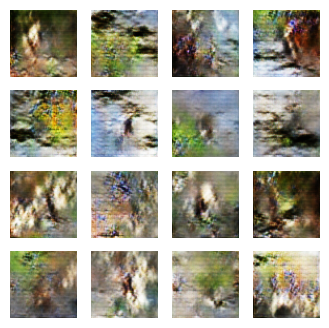

Time for epoch 47 is 133.8724102973938 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

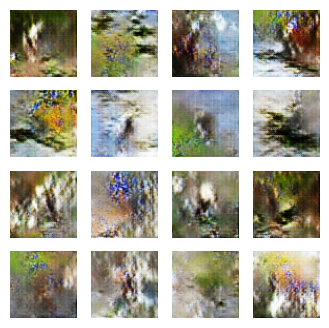

Time for epoch 48 is 130.61381125450134 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

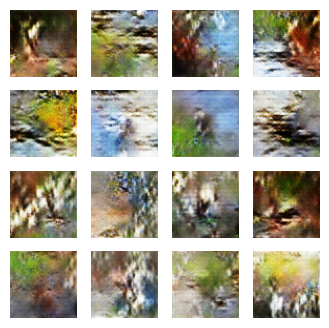

Time for epoch 49 is 131.8334527015686 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

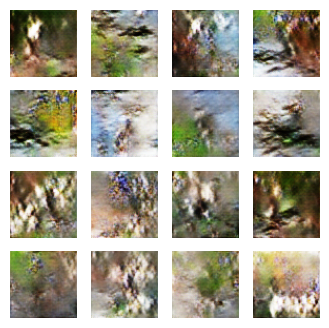

Time for epoch 50 is 127.3740656375885 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

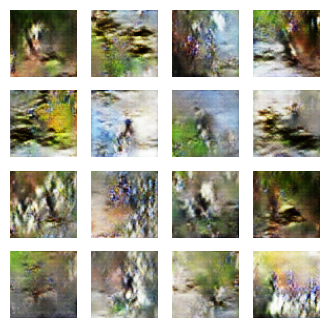

Time for epoch 51 is 128.65689611434937 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

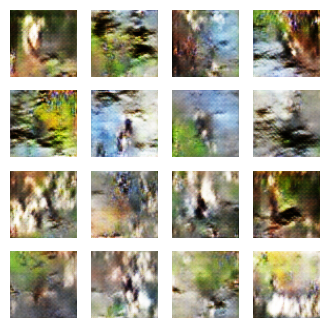

Time for epoch 52 is 126.10935354232788 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

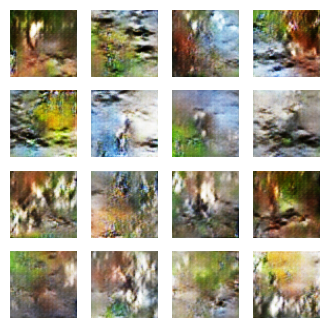

Time for epoch 53 is 125.34610414505005 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

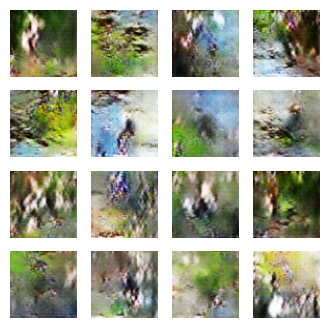

Time for epoch 54 is 126.57299470901489 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

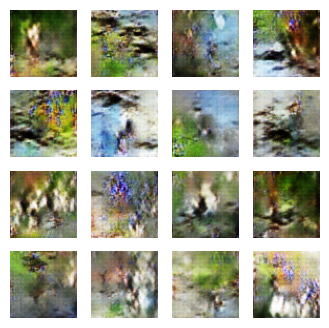

Time for epoch 55 is 129.67232131958008 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

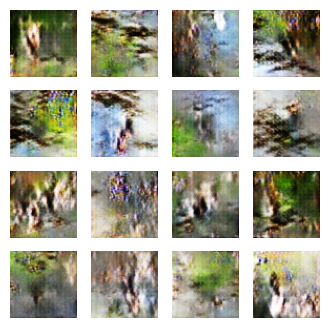

Time for epoch 56 is 130.93676090240479 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

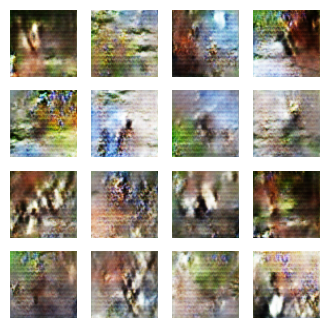

Time for epoch 57 is 141.17672419548035 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

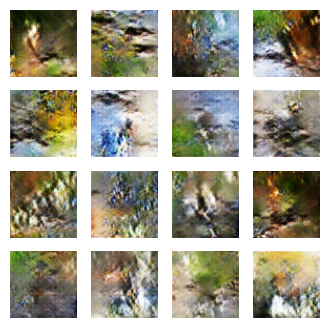

Time for epoch 58 is 134.70821237564087 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

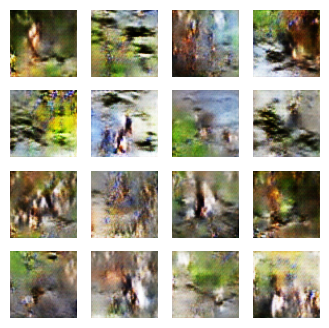

Time for epoch 59 is 132.48499727249146 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

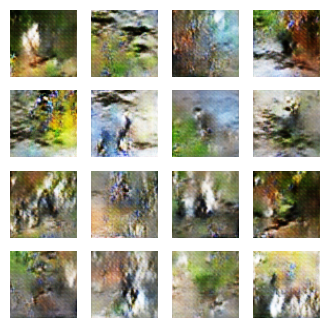

Time for epoch 60 is 135.14646911621094 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

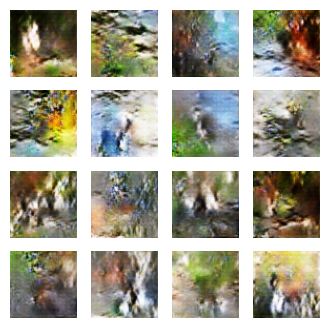

Time for epoch 61 is 134.6813142299652 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

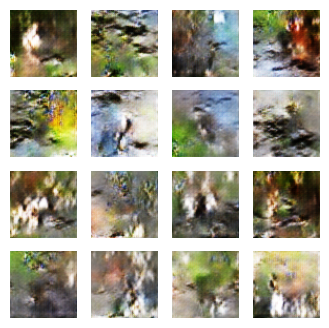

Time for epoch 62 is 132.27801728248596 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

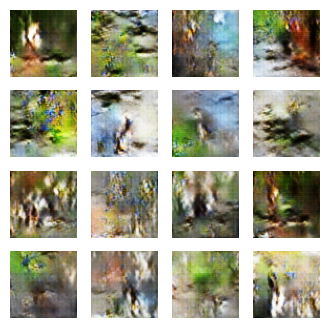

Time for epoch 63 is 129.25963354110718 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

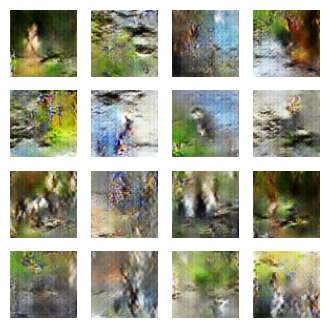

Time for epoch 64 is 128.10369539260864 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

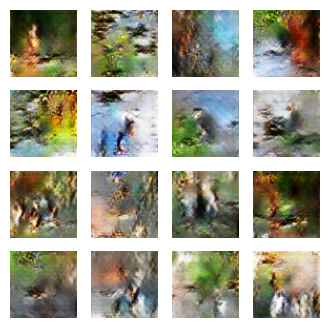

Time for epoch 65 is 124.6470000743866 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tra

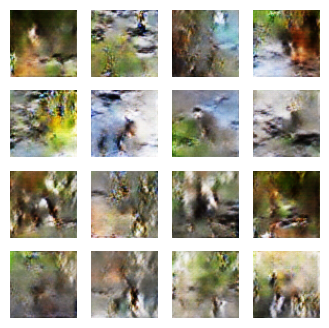

Time for epoch 66 is 125.20781111717224 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

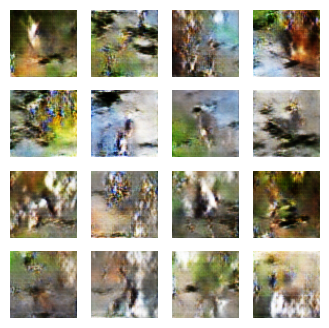

Time for epoch 67 is 128.88511085510254 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

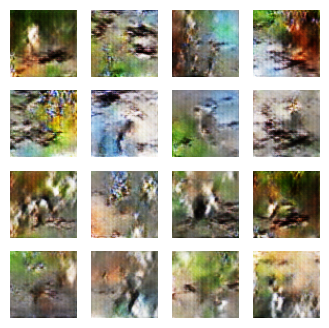

Time for epoch 68 is 140.77688455581665 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

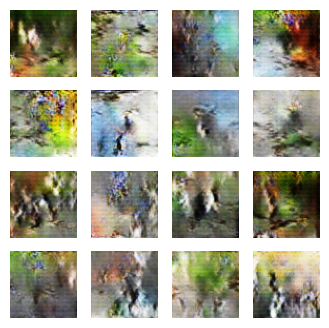

Time for epoch 69 is 159.50263381004333 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
tr

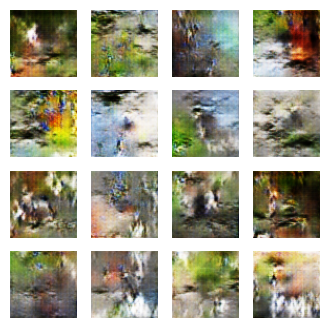

Time for epoch 70 is 130.39050126075745 sec
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called
train_step called


KeyboardInterrupt: 

In [14]:
train(generator, discriminator, gan_image_loader, EPOCHS, noise_dim, generator_optimizer, discriminator_optimizer, criterion)


## using GAN's discriminator for quality check

In [292]:
def generate_images(generator, num_images, noise_dim):
    noise = torch.randn(num_images, noise_dim)
    with torch.no_grad():  # No need to track gradients
        generator.eval()  # Set the generator to evaluation mode
        return generator(noise).cpu()  # Generate images and move to CPU


def quality_check(discriminator, generated_images, threshold=0.5):
    with torch.no_grad():
        discriminator.eval()
        predictions = discriminator(generated_images).squeeze()
        quality_images = generated_images[predictions > threshold]
        return quality_images


# Example usage
generated_images = generate_images(generator, 100,noise_dim)
quality_images = quality_check(discriminator, generated_images)


Discriminator Input Shape: torch.Size([100, 3, 64, 64])
Discriminator Output Shape: torch.Size([100, 1])


In [293]:
len(quality_images)  # Number of images that passed the quality check

3

## feature similarity check

In [281]:
from torchvision.models import resnet50
from torchvision.transforms import Normalize, ToTensor, Resize, Compose
import torch.nn.functional as F

# Load pre-trained ResNet50
feature_model = resnet50(pretrained=True)
feature_model.eval()

def preprocess_images_pytorch(images):
    transform = Compose([
        Resize(256),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    return torch.stack([transform(image) for image in images])

# def extract_features_pytorch(model, images):
def extract_features_pytorch(model, images):
    model.eval()
    with torch.no_grad():
        features = model(images)
    return features.reshape(features.shape[0], -1)


def calculate_similarity_pytorch(original_features, generated_features):
    return F.cosine_similarity(original_features, generated_features, dim=1)



In [294]:
from torchvision.datasets import ImageFolder
from PIL import Image
import os
import random

def load_subset_of_images_for_features(path, image_size=(224, 224), num_images=4):
    transformed_images = []
    dataset = ImageFolder(root=path)  # No transforms here

    # Randomly select 'num_images' indices
    indices = random.sample(range(len(dataset)), num_images)

    for idx in indices:
        img, _ = dataset[idx]
        img = img.resize(image_size)  # Resize the image
        transformed_images.append(img)

    return transformed_images

# Usage
# PATH = Path('./dataset/CUB_200_2011')
# dataset_path = PATH / "images"
subset_of_original_images = load_subset_of_images_for_features(dataset_path, num_images=3)


In [295]:
from torchvision import transforms

def preprocess_images_for_resnet(images, image_size=(224, 224)):
    # Define the transformation
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Apply the transformation to each image in the list
    tensor_images = [transform(img) for img in images]
    
    # Stack all images to create a single tensor
    tensor_images = torch.stack(tensor_images)

    return tensor_images

# Usage
preprocessed_original_images = preprocess_images_for_resnet(subset_of_original_images)
  # from the previous GAN output in PIL format


In [296]:
from torchvision import transforms
import torch

def preprocess_tensor_images_for_resnet(tensor_images, image_size=(224, 224)):
    # Define the transformation pipeline for resizing and normalizing
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Apply the transformation to each tensor image
    preprocessed_images = torch.stack([transform(img) for img in tensor_images])

    return preprocessed_images

# Usage
# Assuming generated_images and quality_images are already tensors
generated_images = quality_images
preprocessed_generated_images = preprocess_tensor_images_for_resnet(generated_images)


c:\Users\tasmi\miniconda3\envs\cs682\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [297]:
original_features = extract_features_pytorch(feature_model, preprocessed_original_images)

In [298]:
original_features.shape

torch.Size([3, 1000])

In [299]:
generated_features = extract_features_pytorch(feature_model, preprocessed_generated_images)

In [300]:
generated_features.shape

torch.Size([3, 1000])

In [301]:
# Example usage
# original_images = ...  # load or define your original dataset images in PIL format




similarity = calculate_similarity_pytorch(original_features, generated_features)

In [302]:
print(calculate_similarity_pytorch(original_features, generated_features))

tensor([0.0899, 0.0168, 0.0067])


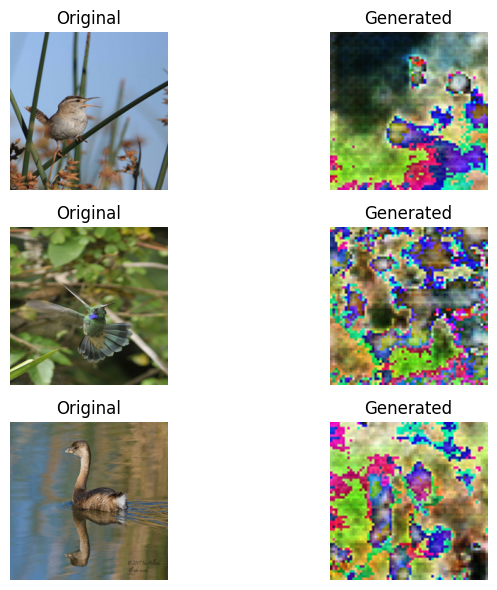

In [303]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import torchvision.transforms as transforms

def tensor_to_pil(tensor_images):
    # Convert a batch of tensors to PIL images
    to_pil = transforms.ToPILImage()
    return [to_pil(img) for img in tensor_images]

# Assuming original_images and generated_images are batches of images in tensor format
original_pil_images = subset_of_original_images
generated_pil_images = tensor_to_pil(generated_images)


# Define the number of rows and columns
num_images = min(len(original_pil_images), len(generated_pil_images))
cols = 2  # original and generated
rows = num_images

plt.figure(figsize=(8, 2 * rows))

for i in range(num_images):
    # Plot original image
    plt.subplot(rows, cols, 2 * i + 1)
    plt.imshow(original_pil_images[i])
    plt.title("Original")
    plt.axis("off")

    # Plot generated image
    plt.subplot(rows, cols, 2 * i + 2)
    plt.imshow(generated_pil_images[i])
    plt.title("Generated")
    plt.axis("off")

plt.tight_layout()
plt.savefig('original_vs_generated.png')
plt.show()
